In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
# import plotly.express as pltly
import plotly
import pandas as pd
from functools import partial
import networkx as net
import plotly.graph_objects as go

In [13]:
np.set_printoptions(suppress = True)

In [4]:
from utils import log2_comb

ModuleNotFoundError: No module named 'utils'

parameters for $\mu-L$ convergence
* $\mu = 2\lambda$       regularization parameter

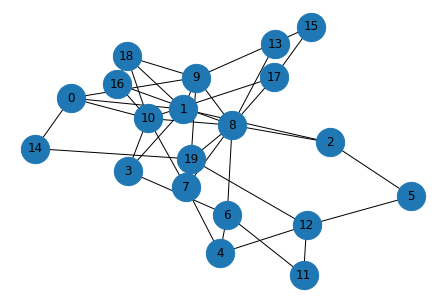

In [9]:
K = 20
seeds = iter(range(1000))
p = 0.2
alg_connect = 0
while alg_connect < 1e-4:
#     ER = net.erdos_renyi_graph(K-1, .2, seed = next(seeds))
#     ER.add_node(K-1)
#     G = net.star_graph(reversed(range(K)))
#     G.add_edges_from(ER.edges())
    G = net.erdos_renyi_graph(K, p, seed = next(seeds))
#     G = net.complete_graph(K)
    pos = net.spring_layout(G)
    LP = np.array(net.laplacian_matrix(G, nodelist = range(K)).todense())
    E, _ = np.linalg.eigh(LP) # eigenvalues are assumed given in an ascending order
    alg_connect = E[1] 
alpha = 2 / (E[K-1] + E[1])
W = np.eye(K) - alpha * LP
pos = net.spring_layout(G)
net.draw(G, pos, with_labels = True, node_size = 800, edge_size = 1000, font_size = 12)

In [10]:
E1, _ = np.linalg.eigh(np.ones((K,K)) / K - W)

In [11]:
1 - np.linalg.norm(np.ones((K,K)) / K - W, ord=2)

0.14251644134953867

In [17]:
# train_images=train_images.reshape((60000,784),order='C')
# SampleCov=[(train_images[sample_indices[i]].T @ train_images[sample_indices[i]]) / len(sample_indices[i]) for i in range(K)]
# lambdaSampleCov=[np.linalg.eigvalsh(SampleCov[i]).reshape((784,1)) for i in range(K)]
# E = 1./2*(np.eye(K) - np.ones((K,1)) @ np.ones((1,K)) / K)
# lambdaE=np.linalg.eigvalsh(E).reshape((K,1))
# lambda_base = [max(.5*lambdaSampleCov[i]).squeeze() for i in range(K)]
lamda = .002
# L = max(lambda_base) + lamda
L = .1581 + .002
mu = lamda
kappa = L / mu
gb = .1 # as the norm bound G for gradient
K = 20
d = 7850
N = 7943
# M= 5
# m = np.floor(N/(2*M)) # N/(2*M), where 2M is the total number of scheduling slots for M-round 'star-like' commun.

beta = np.linalg.norm(np.eye(K) - W, ord=2)
delta = 1 - np.linalg.norm(np.ones((K,K)) / K - W, ord=2)
# rho = 1e6 #average SNR ~40dB

p_ini = lambda delta, beta, omega: delta**2 * omega / (2 * (16*delta + delta**2 + 4*beta**2 + 2*delta*beta**2 - 8*delta*omega))
zeta_ini = lambda delta, beta, omega: delta * omega / (16*delta + delta**2 + 4*beta**2 + 2*delta*beta**2 - 8*delta*omega)
# The optimum a' adpative to other paramters to minimize the upper-bound for optimality gap
# a_prime = ( (169 * 2 * gb**2 * delta) / (mu**2 * c**2 * rho**2 * (2-omega) * m**2/d * zeta_ini) ) ** (1/3)
# when p(t) >= p_ini for the whole training iterations
# a_prime = ( (169 * 2 * gb**2 * 4 * p_ini) / (mu**2 * c**2 * rho**2 * (2-omega) * m**2/d * zeta_ini**2) ) ** (1/3)


The parameters in the following block is applicable to the upperbound for the digital scheme only.

In [18]:
# np.random.seed(2)
d_min = 50
d_max = 200
rho =  d_min + (d_max - d_min) * np.random.rand(K,1) 
theta = 2 * np.pi * np.random.rand(K,1)
# D = np.ones((K, K))
D = np.sqrt(rho ** 2 + rho.T ** 2 - 2 * (rho @ rho.T) * np.cos(theta - theta.T))
# Fill in D[i,i] some non-zero value to avoid Inf in PL
for i in range(K):
    if i:
        D[i,i] = D[i,i-1]
    else:
        D[i,i] = D[i,i+1]
A0 = 10 ** (-3.35)
d0 = 1
gamma = 3.76
PL = A0 * ((D / d0) ** (-gamma))
barP = .2 / N # assume the total transmitting power of all availalbe channel uses (unit time) is .2
M = 5 # the chromatic number for the digital scheme
N0 = 10 ** (-169/10) * 1e-3
c_array = [ sum((D[i,j] / d0) ** gamma / A0 for j in G[i]) for i in range(K)]
b = 64

F = lambda n: log2_comb(d, n) + b * n
G = lambda n, i:np.exp(-c_array[i] / (.2 / N0) * (N/M) * (2**(F(n) / (N/M)) - 1))
omega_dig = min([ sum(G(n,i) for n in range(1,d+1)) / d for i in range(K) ])

TypeError: 'function' object is not subscriptable

In [16]:
L

0.1601

In [20]:
delta

0.14251644134953867

In [19]:
beta

1.8574835586504608

In [31]:
def errror_ub(gb, d, K, N, M, a, a_prime, T, delta = 0.1425, beta = 1.8575, rho = 1e7):
    m = int(N/(2*M))
    omega = m / d
    a4 = omega/2
    zeta_ini = delta * omega / (16*delta + delta**2 + 4*beta**2 + 2*delta*beta**2 - 8*delta*omega)
    p_ini = delta**2 * omega / (2 * (16*delta + delta**2 + 4*beta**2 + 2*delta*beta**2 - 8*delta*omega))
    e = delta * zeta_ini
    f = (delta**2 /4 + 2*beta**2 /omega) * zeta_ini**2
#     c = .9999 * (delta * zeta_ini - (delta**2/4 + 2/omega * beta**2) * zeta_ini**2)
    D = 6.5 * np.sqrt(2) * gb / (mu * p_ini * a)
    
    p = lambda t: -(delta**2 /4 + 2*beta**2 /omega) * zeta_ini**2/(t/(rho * a_prime)+1)**2 + delta*zeta_ini/(t/(rho * a_prime)+1)
#     eta = lambda t: D * c / (2*np.sqrt(2) * gb) / (t/ (rho * a_prime) +1)
    eta = lambda t: 3.25 / mu / (t + a)
    zeta = lambda t: zeta_ini /(t/ (rho * a_prime) +1)
    a2 = lambda t: delta*zeta(t) / 2
    
    e_cons_array = [ ]
    e_comp_array = [ ]
    e_noise_array = [ ]
    
    t_array = np.arange(1,T)
    e_cons_pre = 0
    e_comp_pre = 0
    e_noise_pre = 0

    e_cons_array.append(e_cons_pre)
    e_comp_array.append(e_comp_pre)
    e_noise_array.append(e_noise_pre)
    flag = 1
    for t in t_array:
        if p(t) < p_ini and flag:
            print(t)
            bar_t = t
            flag = 0
        
#         if flag:
#             p = p_ini
#         else:
#             p = p(t)
            
#         e_cons =  (1+a2(t))*(1-delta*zeta(t))**2 * ( (1+p/2) * e_cons_pre + (1+2/p) * K * eta(t)**2 * gb**2 ) +\
#         (1+1/a2(t)) * beta**2 * zeta(t)**2 * ( (1+p/2) * e_comp_pre + (1+2/p) * K * eta(t)**2 *gb**2 ) +\
#         zeta(t)**2 * m**2/d * K * t /rho 
#         e_comp = (1-omega)*(1+1/a4)*beta**2 * zeta(t)**2 * ((1+p/2) * e_cons_pre + (1+2/p) * K*eta(t)**2 * gb**2) +\
#         (1-omega)*(1+a4)*(1+beta*zeta(t))**2 * e_comp_pre +\
#         (1-omega) * zeta(t)**2 * m**2/d * K * t /rho
#     #     e_sum = (1-p(t) / 2) * e_sum_pre + \
#     #     4/p(t) * K * (eta(t)**2) * gb**2 + (2-omega) * zeta(t)**2 * m**2/d * K * t /rho
#         e_noise = (2-omega) * zeta(t)**2 * m**2/d * K * t /rho
        
#         e_cons_array.append(e_cons / K)
#         e_comp_array.append(e_comp / K)
#         e_noise_array.append(e_noise / K)
#         e_cons_pre = e_cons
#         e_comp_pre = e_comp
    
    if flag:
        if T < rho*a_prime:
            C = D**2 + 2/p_ini * (2-omega) * m**2/d * (1/rho) * zeta(T)**2 * T
        else:
            C = D**2 + 1/(2*p_ini) * (2-omega) * m**2/d * zeta_ini**2 * a_prime
    elif bar_t < rho*a_prime:
        C = D**2 + (2 * (2-omega) * m**2/d * (1/rho) * zeta_ini**2 * T) / (e * (T/(rho*a_prime) + 1) - f)
    else:
        C = D**2 + max( 1/(2*p_ini) * (2-omega) * m**2/d * zeta_ini**2 * a_prime,\
                       (2 * (2-omega) * m**2/d * (1/rho) * zeta_ini**2 * T) / (e * (T/(rho*a_prime) + 1) - f) )

    
    
    return e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D

10

Theorem 1 (modification of Theorem 19 (A.Koloskova *et al.* 19))
$$\mathbb{E}[f(x^{(T)}_{avg})-f(x^\ast)]\le\frac{\mu}{3.25}\frac{a^3-3.25a^2}{S_T}a_0 + \frac{1.625T(T+2a-1)}{\mu S_T}\frac{{\bar\sigma}^2}{K}+\frac{(3.25^2\times 80)LT}{\mu^2(p(\delta,\omega))^2S_T}G^2$$

Theorem 2
$$\mathbb{E}[f(x^{(T)}_{avg})-f(x^\ast)]\le\frac{\mu}{3.25}\frac{a^3-3.25a^2}{S_T}a_0+\frac{1.625T(T+2a)}{\mu S_T}\frac{\bar\sigma^2}{K}+\frac{211.25\left(4G^2+\frac{A(\delta,\omega)}{K}\sqrt[\leftroot{-4}\uproot{1}4]{\tilde N_0}\right)LT}{\mu^2(p^{(T)}(\delta,\omega))^2 S_T}+C(\delta,\omega,\tilde N_0)$$
in which $p^{(t)}(\delta,\omega)=\min\{\tilde p^{(t)}(\delta,\omega), p(\delta,\omega)\}$ with  
$$\tilde p^{(t)}(\delta,\omega)=\frac{\delta\zeta_0}{\sqrt[\leftroot{-2}\uproot{4}4]{\tilde N_0}t/a^\prime+1}-\left(\frac{\delta^2}{4}+\frac{2}{\omega}\beta^2\right)\frac{\zeta_0^2}{\big(\sqrt[\leftroot{-2}\uproot{4}4]{\tilde N_0}t/a^\prime+1\big)^2}, $$ 
$$A(\delta,\omega)=\delta(\zeta_0a^\prime)^3(2-\omega)\omega^2d(\frac{\mu}{3.25})^2, $$ and 
$$C(\delta,\omega,\tilde N_0)=\frac{1}{K^2}(\zeta_0a^\prime)^2\omega^2d\frac{\mu}{3.25}\sqrt{\tilde N_0}$$

**Evaluate the analytical upper-bound  for $\frac{1}{S_T}\sum_{t=0}^{T-1}w_{t}F({\bar{\theta}}^{(t)})$ with varying $\rho$**

In [337]:
gb = .1 # as the norm bound G for gradient
K = 20
d = 7850
N = 7943
a = 5e5
a_prime = 2500
delta = 0.1425
beta = 1.8575
M= 5
bar_sigma_sqr= 1
a0 = 20
sT_dig = lambda T: np.sum((a + np.arange(T))**2, axis = 0)
sT_ana = lambda T: np.sum((a + np.arange(T))**2, axis = 0)
og_dig = lambda T: mu/3.25 * (a**3 - 3.25 * a **2) / sT_dig(T) * a0 + \
1.625 * T * (T + 2 * a -1) / (mu * sT_dig(T)) * (bar_sigma_sqr / K) + \
(845 * L * T) / (mu**2 * p **2 * sT_dig(T)) * gb**2

og_ana = lambda T: mu/3.25 * (a**3 - 3.25 * a **2) / sT_ana(T) * a0 + \
1.625 * T * (T+2 * a -1) / (mu * sT_ana(T)) * (bar_sigma_sqr / K + 2 * L**2 * C) + L * C

Tmax = 3e3 
T_array= np.arange(1, Tmax)
fig = go.Figure()
rho = 200 # P~=0.0001, rho_a_prime~=66.67
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias1 = L * C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'$\rho=23\mbox{dB}$'))

rho = 500 # P~=0.0003, rho_a_prime~=166.67
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias2 = L* C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'$\rho=27\mbox{dB}$'))


rho = 3000 # P~=0.002, rho_a_prime~=997.63
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias3 = L* C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'$\rho=35\mbox{dB}$'))

rho = 125061 # P~=0.08, rho_a_prime~=41588.19
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias4 = L* C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'$\rho=51\mbox{dB}$'))


# When N_0 = 0, the analog scheme can be reduced to the CHOCO_SGD with omega = int(N/(2*M)) / d and no bias
m = int(N/(2*M))
omega = m / d
p = delta**2 * omega / (2 * (16*delta + delta**2 + 4*beta**2 + 2*delta*beta**2 - 8*delta*omega))
# p = delta**2 * omega / 82
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
                    line=dict(dash='dash'),
                    name=r'$\rho=\inf\ \mbox{(CHOCO)}$'
                        ))

fig.update_xaxes(range=[20, 3000])
fig.update_yaxes(range=[np.log10(30), np.log10(650)])
fig.update_layout(
    title=r'$\mbox{Relative parameter settings:}\ a=5\times 10^5,\ \rho a^\prime=2500\rho,\ N = 7943,\ \mbox{and}\ \mbox{non-zero ratios}\ \omega=\frac{N/10}{d}=0.10$',
    xaxis_title=r'$\mbox{Number of communication rounds}\ T$',
    yaxis_title=r'$\mbox{Upper bound for}\ \mathbb{E}\left[f(x^{(T)}_{\rm avg})-f(x^\ast)\right]$',
    font=dict(
        size=12,
    ),
#     xaxis_type = 'log',
    yaxis_type = 'log'
)

fig.show()

# plotly.io.orca.config.executable = r'C:\ProgramData\Anaconda3\orca_app\orca.exe'
# plotly.io.orca.config.save()
# fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/repo_jv/fig/og_ub_with_CHOCO_vs_rho.pdf')

In [300]:
bias1

45.56684747505124

In [301]:
bias2

40.41512410834077

In [302]:
bias3

37.52088463927997

In [303]:
bias4

36.95321759658933

0.10114649681528662

**Evaluate the emprical value of $\frac{1}{S_T}\sum_{t=0}^{T-1}w_{t}F({\bar{\theta}}^{(t)})$ ( vs the actual loss fun $F({\bar{\theta}}^{(T)})$ with varying $\rho$**

In [327]:
# For an ER graph of connectivity probability of p = 0.20
losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.0001_N_7943_rho_a_500.00_zeta0_0.0100_rho_a_prime_66.67.pkl', 'rb') )
losseses = np.array(losseses)
df1 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )

T = losseses.shape[1]
w_array =  (a + np.arange(T))**2
fig = go.Figure()

F_bar_array = df1.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'$\rho=23\mbox{dB}$',
#                     showlegend = True
                        ))

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.0003_N_7943_rho_a_500.00_zeta0_0.0100_rho_a_prime_166.67.pkl', 'rb') )
losseses = np.array(losseses)
df2 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df2.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'$\rho=27\mbox{dB}$'
                        ))

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.002_N_7943_rho_a_500.00_zeta0_0.0100_rho_a_prime_997.63.pkl', 'rb') )
losseses = np.array(losseses)
df3 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df3.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'$\rho=35\mbox{dB}$'
                        ))

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.08_N_7943_rho_a_500.00_zeta0_0.0100_rho_a_prime_41588.19.pkl', 'rb') )
losseses = np.array(losseses)
df4 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df4.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'$\rho=51\mbox{dB}$'
                        ))

# losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.29_N_7943_rho_a_500.00_zeta0_0.0100_rho_a_prime_144201.58.pkl', 'rb') )
# losseses = np.array(losseses)
# df5 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_Inf_N_7943_rho_a_500.00_zeta0_0.0100_CHOCO.pkl', 'rb') )
losseses = np.array(losseses)
df6 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df6.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    line=dict(dash='dash'),
                    name=r'$\rho=\inf\ \mbox{(CHOCO)}$'
                        ))

losseses = pickle.load( open('../repo_jv/data/losseses_local_eta0_2.00.pkl', 'rb') )
losseses = np.array(losseses)
df8 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df8.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
#                     mode='lines',
                    line=dict(dash='dot'),
                    name=r'No commun.'
                        ))

fig.update_xaxes(range=[50, 3000])
fig.update_yaxes(range=[0.45, 0.95])
fig.update_layout(
#     title=r'$\mbox{Relative parameter settings:}\ a=5\times 10^5,\ \rho a^\prime=2500\rho,\ \omega=\frac{N/10}{d},\ N = 7943,\ \mbox{and}\ \omega=\frac{N/10}{d}$',
    xaxis_title=r'$\mbox{Number of communication rounds}\ T$',
    yaxis_title=r'$\mathbb{E}\left[f(x^{(T)}_{\rm avg})-f(x^\ast)\right]$',
    font=dict(
        size=12,
    ),
)

fig.show()

# fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/repo_jv/fig/og_empirical_vs_rho.pdf')

array([2.50000000e+11, 2.50001000e+11, 2.50002000e+11, ...,
       2.53005982e+11, 2.53006988e+11, 2.53007994e+11])

In [136]:
fig.add_annotation(
        x=92,
        y=np.log10(350),
        xref="x",
        yref="y",
        text=r"$\rho=10^8,\, \mathrm{analog}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=40,
        ay=-30
)

fig.add_annotation(
        x=1413,
        y=np.log10(9),
        xref="x",
        yref="y",
        text=r"$\rho=10^7,\, \mathrm{analog}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=-40,
        ay=30
)

fig.add_annotation(
        x=2018,
        y=np.log10(39),
        xref="x",
        yref="y",
        text=r"$\rho=2\times 10^6,\, \mathrm{analog}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=40,
        ay=-30
)

fig.add_annotation(
        x=9880,
        y=np.log10(8.06),
        xref="x",
        yref="y",
        text=r"$\rho=10^8,\, \mathrm{digital}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=30,
        ay=20
)

fig.add_annotation(
        x=4607,
        y=np.log10(15.56),
        xref="x",
        yref="y",
        text=r"$\rho=10^7,\, \mathrm{digital}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=45,
        ay=-35
)

fig.add_annotation(
        x=6772,
        y=np.log10(19.63),
        xref="x",
        yref="y",
        text=r"$\rho=2\times 10^6,\, \mathrm{digital}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=45,
        ay=-35
)

fig.show()
# fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/analysis/Figs/compare_og_ub_vs_rho.pdf')

**Evaluate the analytical upper-bound  for $\frac{1}{S_T}\sum_{t=0}^{T-1}w_{t}F({\bar{\theta}}^{(t)})$ with varying channel uses $N$**

In [21]:
gb = .1 # as the norm bound G for gradient
K = 20
d = 7850
rho = 300000
a = 3e6
a_prime = 10
delta = 0.1425
beta = 1.8575
M= 5
bar_sigma_sqr= 1
a0 = 20
sT_dig = lambda T: np.sum((a + np.arange(T))**2, axis = 0)
sT_ana = lambda T: np.sum((a + np.arange(T))**2, axis = 0)
og_dig = lambda T: mu/3.25 * (a**3 - 3.25 * a **2) / sT_dig(T) * a0 + \
1.625 * T * (T + 2 * a -1) / (mu * sT_dig(T)) * (bar_sigma_sqr / K) + \
(845 * L * T) / (mu**2 * p **2 * sT_dig(T)) * gb**2

og_ana = lambda T: mu/3.25 * (a**3 - 3.25 * a **2) / sT_ana(T) * a0 + \
1.625 * T * (T+2 * a -1) / (mu * sT_ana(T)) * (bar_sigma_sqr / K + 2 * L**2 * C) + L * C

Tmax = 3e3 
T_array= np.arange(1, Tmax)
fig = go.Figure()
N  = 785 
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias1 = L * C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'$N=785,\ \omega = 0.01$'))

N = 7943
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias2 = L* C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'$N=7943,\ \omega = 0.10$'))


N = 31871
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias3 = L* C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'$N=31871,\ \omega = 0.41$'))

N = 78500
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias4 = L* C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'$N=78500,\ \omega = 1.00$'))


# When N_0 = 0, the analog scheme can be reduced to the CHOCO_SGD with omega = int(N/(2*M)) / d and no bias
N = 7943
m = int(N/(2*M))
omega = m / d
p = delta**2 * omega / (2 * (16*delta + delta**2 + 4*beta**2 + 2*delta*beta**2 - 8*delta*omega))
# p = delta**2 * omega / 82
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
                    line=dict(dash='dash'),
                    name=r'$N=7943,\ \omega = 0.10, \rho=\inf\ \mbox{(CHOCO)}$'
                        ))

fig.update_xaxes(range=[100, 3000])
fig.update_yaxes(range=[0, 520])
fig.update_layout(
    title=r'$\mbox{Relative parameter settings:}\ a=3\times 10^6,\ \rho\approx 55{\rm dB},\ \mbox{and}\ \mbox{the compression ratio}\ \omega=\frac{N/10}{d}$',
    xaxis_title=r'$\mbox{Number of communication rounds}\ T$',
    yaxis_title=r'$\mbox{Upper bound for}\ \mathbb{E}\left[f(x^{(T)}_{\rm avg})-f(x^\ast)\right]$',
    font=dict(
        size=12,
    ),
#     xaxis_type = 'log',
#     yaxis_type = 'log'
)

fig.show()

# plotly.io.orca.config.executable = r'C:\ProgramData\Anaconda3\orca_app\orca.exe'
# plotly.io.orca.config.save()
# fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/repo_jv/fig/og_ub_with_CHOCO_vs_N.pdf')

NameError: name 'errror_ub' is not defined

In [555]:
bias1

107.63249710929016

In [556]:
bias2

1.0318997315906442

In [557]:
bias3

0.3830635463276494

In [558]:
bias4

3.155798081026575

In [542]:
omega

0.10114649681528662

**Evaluate the emprical value of $\frac{1}{S_T}\sum_{t=0}^{T-1}w_{t}F({\bar{\theta}}^{(t)})$ ( vs the actual loss fun $F({\bar{\theta}}^{(T)})$ with varying $N$**

In [646]:
# For an ER graph of connectivity probability of p = 0.20
losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.02_N_785_rho_a_500.00_zeta0_0.0100_rho_a_prime_10000.00.pkl', 'rb') )
losseses = np.array(losseses)
df1 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )

T = losseses.shape[1]
w_array =  (a + np.arange(T))**2
fig = go.Figure()

F_bar_array = df1.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'$N=785,\ \omega=0.01$',
#                     showlegend = True
                        ))

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.02_N_7943_rho_a_500.00_zeta0_0.0100_rho_a_prime_10000.00.pkl', 'rb') )
losseses = np.array(losseses)
df2 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df2.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'$N=7943,\ \omega=0.10$'
                        ))

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.02_N_31871_rho_a_500.00_zeta0_0.0100_rho_a_prime_10000.00.pkl', 'rb') )
losseses = np.array(losseses)
df3 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df3.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'$N=31871,\ \omega=0.41$'
                        ))

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.02_N_78500_rho_a_500.00_zeta0_0.0100_rho_a_prime_10000.00.pkl', 'rb') )
losseses = np.array(losseses)
df4 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df4.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'$N=78500,\ \omega=1.00$'
                        ))

# losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.29_N_7943_rho_a_500.00_zeta0_0.0100_rho_a_prime_144201.58.pkl', 'rb') )
# losseses = np.array(losseses)
# df5 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_Inf_N_7943_rho_a_500.00_zeta0_0.0100_CHOCO.pkl', 'rb') )
losseses = np.array(losseses)
df6 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df6.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    line=dict(dash='dash'),
                    name=r'$N=7943,\ \omega=0.10,\ \rho=\inf\ \mbox{(CHOCO)}$'
                        ))

losseses = pickle.load( open('../repo_jv/data/losseses_local_eta0_2.00.pkl', 'rb') )
losseses = np.array(losseses)
df8 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df8.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
#                     mode='lines',
                    line=dict(dash='dot'),
                    name=r'No commun.'
                        ))

fig.update_xaxes(range=[100, 3000])
fig.update_yaxes(range=[0.45, 0.85])
fig.update_layout(
#     title=r'$\mbox{Relative parameter settings:}\ a=5\times 10^5,\ \rho a^\prime=2500\rho,\ \omega=\frac{N/10}{d},\ N = 7943,\ \mbox{and}\ \omega=\frac{N/10}{d}$',
    xaxis_title=r'$\mbox{Number of communication rounds}\ T$',
    yaxis_title=r'$\mathbb{E}\left[f(x^{(T)}_{\rm avg})-f(x^\ast)\right]$',
    font=dict(
        size=12,
    ),
)

fig.show()

# fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/repo_jv/fig/og_empirical_vs_N.pdf')

In [178]:
fig.add_annotation(
        x=5025,
        y=np.log10(5.49),
        xref="x",
        yref="y",
        text=r"$M=5,\, \mathrm{analog}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=-35,
        ay=30
)

fig.add_annotation(
        x=4000,
        y=np.log10(8.30),
        xref="x",
        yref="y",
        text=r"$M=10,\, \mathrm{analog}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=-35,
        ay=30
)

fig.add_annotation(
        x=2052,
        y=np.log10(17.62),
        xref="x",
        yref="y",
        text=r"$M=1,\, \mathrm{analog}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=-35,
        ay=30
)

fig.add_annotation(
        x=3083,
        y=np.log10(18.00),
        xref="x",
        yref="y",
        text=r"$M=1,\, \mathrm{digital}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=40,
        ay=-25
)

fig.add_annotation(
        x=4019,
        y=np.log10(52.08),
        xref="x",
        yref="y",
        text=r"$M=5,\, \mathrm{digital}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=40,
        ay=-25
)

fig.add_annotation(
        x=5963,
        y=np.log10(159.33),
        xref="x",
        yref="y",
        text=r"$M=10,\, \mathrm{digital}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=40,
        ay=-25
)

fig.show()
fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/analysis/Figs/compare_og_ub_vs_omega.pdf')

In [111]:
# Characterize the biased term in the asymptotic optimality gap, i.e., (L+mu)*C, versus the compression ratio (omega = m/d)
delta, beta = 0.1425, 1.8575
zeta_ini = lambda omega: delta * omega / (16*delta + delta**2 + 4*beta**2 + 2*delta*beta**2 - 8*delta*omega)
p_ini = lambda omega: delta**2 * omega / (2 * (16*delta + delta**2 + 4*beta**2 + 2*delta*beta**2 - 8*delta*omega))
c = lambda omega: .9999 * (delta * zeta_ini(omega) - (delta**2/4 + 2/omega * beta**2) * zeta_ini(omega)**2)
D = lambda omega: 6.5 * np.sqrt(2) * gb / (mu * c(omega) * rho * a_prime)
bias_vs_omega = lambda omega: L * max(D(omega)**2 + 2/delta * (2-omega) * omega**2 * d * zeta_ini(omega) * a_prime, \
        D(omega)**2 + (2-omega) * omega**2 * d * zeta_ini(omega)**2 * a_prime / (2 * p_ini(omega)))

# omega = m / d
omega_array = np.linspace(.1,1,100)
fig = go.Figure()

rho = 5e7
fig.add_trace(go.Scatter(x=omega_array, y=list(map(bias_vs_omega, omega_array)),
                         mode='lines',
                        name=r'$\rho=5\times10^7$',
#                         showlegend=False
                        ))
rho = 1e7
fig.add_trace(go.Scatter(x=omega_array, y=list(map(bias_vs_omega, omega_array)),
                         mode='lines',
                        name=r'$\rho=10^7$',
#                         showlegend=False
                        ))

rho = 2e6
fig.add_trace(go.Scatter(x=omega_array, y=list(map(bias_vs_omega, omega_array)),
                         mode='lines',
                        name=r'$\rho=2\times 10^6$',
#                         showlegend=False
                        ))
# plt.xlabel(r'Compression ratio $\omega = \frac{\left\lfloor N/M \right\rfloor}{d}$')
# plt.ylabel(r'Asymptotically biased term $LC$')
# plt.xlim([0.2, 1])
# plt.grid()
# plt.title(r'$\eta^{(t)}=\frac{3.25}{\mu}\frac{1}{(t+\rho a^\prime)}$ where $\rho=10^7$ and $a^\prime=0.05$; $\delta = 0.14$')
# plt.savefig('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/analysis/Figs/asym_bias_vs_omega.pdf',format='pdf', dpi=600)
fig.update_layout(
    title=r'$\eta^{(t)}=\frac{3.25}{\mu}\frac{1}{(t+\rho a^\prime)},\ \mbox{where}\ a^\prime=0.05\ \mbox{and}\ \delta=0.14$',
    xaxis_title=r'$\mbox{Compression ratio}\ \omega = \frac{\left\lfloor N/M \right\rfloor}{d}$',
    yaxis_title=r'$\mbox{Asymptotically biased term}\ LC$',
    font=dict(
        size=12,
    ),
#     xaxis_type = 'log',
    yaxis_type = 'log'
)
fig.show()
# fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/analysis/Figs/compare_asym_bias_vs_omega.pdf')

**Evaluate the analytical upper-bound for $\frac{1}{S_T}\sum_{t=0}^{T-1}w_{t}F({\bar{\theta}}^{(t)})$ under varying topologies**

In [640]:
gb = .1 # as the norm bound G for gradient
K = 20
d = 7850
rho = 3000
a = 1e6
a_prime = 2500
delta = 0.1425
beta = 1.8575
# M= 5
bar_sigma_sqr= 1
a0 = 20
sT_dig = lambda T: np.sum((a + np.arange(T))**2, axis = 0)
sT_ana = lambda T: np.sum((a + np.arange(T))**2, axis = 0)
og_dig = lambda T: mu/3.25 * (a**3 - 3.25 * a **2) / sT_dig(T) * a0 + \
1.625 * T * (T + 2 * a -1) / (mu * sT_dig(T)) * (bar_sigma_sqr / K) + \
(845 * L * T) / (mu**2 * p **2 * sT_dig(T)) * gb**2

og_ana = lambda T: mu/3.25 * (a**3 - 3.25 * a **2) / sT_ana(T) * a0 + \
1.625 * T * (T+2 * a -1) / (mu * sT_ana(T)) * (bar_sigma_sqr / K + 2 * L**2 * C) + L * C

Tmax = 3e3 
T_array= np.arange(1, Tmax)
fig = go.Figure()
N = 1588
M = 1
beta = 1.90
delta = 0.10
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias1 = L * C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'Star'))

N = 7943
M = 5
beta = 1.86
delta = 0.14
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias2 = L* C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'ER graph'))


N = 7943
M = 5
beta = 1.69
delta = 0.31
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias3 = L* C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'2D-torus'))

N  = 30172
M = 19
beta = 1.00
delta = 1.00
# p = p_ini(delta, beta, omega_dig(2*M,rho))
# fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
#                     line=dict(dash ='dash'),
#                     showlegend=False))
e_cons_array, e_comp_array, e_noise_array, eta, zeta, C, D = errror_ub(gb, d, K, N, M, a, a_prime, Tmax, delta = delta, beta = beta, rho = rho)
bias4 = L* C
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_ana, T_array)),
                    mode='lines',
                    name=r'Complete graph'))


# When N_0 = 0, the analog scheme can be reduced to the CHOCO_SGD with omega = int(N/(2*M)) / d and no bias
N = 7943
M = 5
beta = 1.86
delta = 0.14
m = int(N/(2*M))
omega = m / d
p = delta**2 * omega / (2 * (16*delta + delta**2 + 4*beta**2 + 2*delta*beta**2 - 8*delta*omega))
# p = delta**2 * omega / 82
fig.add_trace(go.Scatter(x=T_array, y=list(map(og_dig, T_array)),
                    line=dict(dash='dash'),
                    name=r'ER graph (CHOCO)'
                        ))

fig.update_xaxes(range=[50, 3000])
fig.update_yaxes(range=[0, 380])
fig.update_layout(
    title=r'$\mbox{Relative parameter settings:}\ a=1\times 10^6,\ \rho\approx 35{\rm dB},\ \mbox{and}\ \mbox{the compression ratio}\ \omega=0.10$',
    xaxis_title=r'$\mbox{Number of communication rounds}\ T$',
    yaxis_title=r'$\mbox{Upper bound for}\ \mathbb{E}\left[f(x^{(T)}_{\rm avg})-f(x^\ast)\right]$',
    font=dict(
        size=12,
    ),
#     xaxis_type = 'log',
#     yaxis_type = 'log'
)

fig.show()

# plotly.io.orca.config.executable = r'C:\ProgramData\Anaconda3\orca_app\orca.exe'
# plotly.io.orca.config.save()
fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/repo_jv/fig/og_ub_with_CHOCO_vs_topology.pdf')

In [622]:
bias1

37.430973930233684

In [623]:
bias2

10.475640561998029

In [624]:
bias3

1.0122647521181247

In [625]:
bias4

0.4512905098519225

**Evaluate the emprical value of $\frac{1}{S_T}\sum_{t=0}^{T-1}w_{t}F({\bar{\theta}}^{(t)})$ ( vs the actual loss fun $F({\bar{\theta}}^{(T)})$ under different topologies**

In [641]:
# For an ER graph of connectivity probability of p = 0.20
losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.02_N_1588_rho_a_2000.00_zeta0_0.0100_rho_a_prime_10000.00_pure_star.pkl', 'rb') )
losseses = np.array(losseses)
df1 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )

T = losseses.shape[1]
w_array =  (a + np.arange(T))**2
fig = go.Figure()

F_bar_array = df1.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'Star',
#                     showlegend = True
                        ))

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.02_N_7943_rho_a_2000.00_zeta0_0.0100_rho_a_prime_10000.00.pkl', 'rb') )
losseses = np.array(losseses)
df2 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df2.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'ER graph'
                        ))

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.02_N_7943_rho_a_2000.00_zeta0_0.0100_rho_a_prime_10000.00_2D-torus.pkl', 'rb') )
losseses = np.array(losseses)
df3 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df3.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'2D-torus'
                        ))

losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.02_N_30172_rho_a_2000.00_zeta0_0.0100_rho_a_prime_10000.00_CG.pkl', 'rb') )
losseses = np.array(losseses)
df4 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df4.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
                    mode='lines',
                    name=r'Complete graph'
                        ))

# losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_0.29_N_7943_rho_a_500.00_zeta0_0.0100_rho_a_prime_144201.58.pkl', 'rb') )
# losseses = np.array(losseses)
# df5 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )

# losseses = pickle.load( open('../repo_jv/data/pair-wise/losseses_SCHEME_5_P_Inf_N_7943_rho_a_500.00_zeta0_0.0100_CHOCO.pkl', 'rb') )
# losseses = np.array(losseses)
# df6 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
# F_bar_array = df6.rolling(window = 5).mean().mean(axis = 'columns')
# weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
# fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
#                     line=dict(dash='dash'),
#                     name=r'$N=7943,\ \omega=0.10\ \mbox{(CHOCO)}$'
#                         ))

losseses = pickle.load( open('../repo_jv/data/losseses_local_eta0_2.00.pkl', 'rb') )
losseses = np.array(losseses)
df8 = pd.DataFrame(losseses[0], columns = ['Device_{}'.format(i + 1) for i in range(K)] )
F_bar_array = df8.rolling(window = 5).mean().mean(axis = 'columns')
weighted_F_bar_array=(w_array * F_bar_array).cumsum(axis=0) / w_array.cumsum(axis=0)
fig.add_trace(go.Scatter(x=T_array, y=weighted_F_bar_array,
#                     mode='lines',
                    line=dict(dash='dot'),
                    name=r'No commun.'
                        ))

fig.update_xaxes(range=[100, 3000])
fig.update_yaxes(range=[0.50, 0.95])
fig.update_layout(
#     title=r'$\mbox{Relative parameter settings:}\ a=5\times 10^5,\ \rho a^\prime=2500\rho,\ \omega=\frac{N/10}{d},\ N = 7943,\ \mbox{and}\ \omega=\frac{N/10}{d}$',
    xaxis_title=r'$\mbox{Number of communication rounds}\ T$',
    yaxis_title=r'$\mathbb{E}\left[f(x^{(T)}_{\rm avg})-f(x^\ast)\right]$',
    font=dict(
        size=12,
    ),
)

fig.show()

fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/repo_jv/fig/og_empirical_vs_topology.pdf')

In [198]:
fig.add_annotation(
        x=7003,
        y=np.log10(0.96),
        xref="x",
        yref="y",
        text=r"$\mathrm{CG (\delta =1)},\, \mathrm{analog}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=-50,
        ay=30
)

fig.add_annotation(
        x=8031,
        y=np.log10(1.08),
        xref="x",
        yref="y",
        text=r"$\mathrm{2D-torus (\delta = 0.31)},\, \mathrm{analog}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=50,
        ay=-30
)

fig.add_annotation(
        x=5693,
        y=np.log10(6.67),
        xref="x",
        yref="y",
        text=r"$\mathrm{ER (\delta = 0.14)},\, \mathrm{analog}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=-50,
        ay=30
)

fig.add_annotation(
        x=5132,
        y=np.log10(9.61),
        xref="x",
        yref="y",
        text=r"$\mathrm{CG (\delta =1)},\, \mathrm{digital}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=45,
        ay=-30
)

fig.add_annotation(
        x=7386,
        y=np.log10(8.51),
        xref="x",
        yref="y",
        text=r"$\mathrm{2D-torus (\delta = 0.31)},\, \mathrm{digital}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=45,
        ay=-30
)

fig.add_annotation(
        x=7995,
        y=np.log10(41.32),
        xref="x",
        yref="y",
        text=r"$\mathrm{ER (\delta = 0.14)},\, \mathrm{digital}$",
        font=dict(size=12),
        showarrow=True,
         arrowhead=2,
         arrowsize=1,
        arrowwidth=1,
        ax=45,
        ay=-30
)

fig.show()
# fig.write_image('C:/Users/Helen/Documents/visiting_research@KCL/D2D_DSGD/analysis/Figs/compare_og_ub_vs_topology.pdf')